## Описание задачи

Задача предсказать возраст краба по характеристикам, которые известны о нем:
Sex - пол;  
Length - длина;  
Diameter - Диаметр;  
Height - высота;  
Weight - вес;	
Shucked Weight - вес панцыря;  
Viscera Weight - вес внутренностей;  
Shell Weight - вес клешней.

**Целевой признак:** Age - Возраст.

**Метрика качества:**  Mean Absolute Error (MAE)

##  Исследовательский анализ

!pip install optuna

In [1]:
from warnings import filterwarnings

filterwarnings("ignore", category=DeprecationWarning) 
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)

import pandas as pd
import matplotlib as plt
import matplotlib.pyplot as pltt
import numpy as np

from phik.report import plot_correlation_matrix, correlation_report

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib as plt
import matplotlib.pyplot as pltt
import numpy as np

from phik.report import plot_correlation_matrix, correlation_report

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.compose import (
    ColumnTransformer,
    make_column_transformer,
    make_column_selector as selector)

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.dummy import DummyClassifier
from sklearn.metrics import mean_squared_error, mean_absolute_error

from sklearn.model_selection import (
    GridSearchCV, 
    RandomizedSearchCV,
    train_test_split)

import optuna
    
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import (
    OneHotEncoder,
    OrdinalEncoder,
    StandardScaler,
    FunctionTransformer)

In [3]:
RANDOM_STATE = 12345

Создадим дополнительные признаки для лучшего обучения модели

In [4]:
def fuature_ing(df):
    #относительные параметры
    df['viscera_ratio'] = df['viscera_weight'] / df['weight']
    df['shell_ratio'] = df['shell_weight'] / df['weight']
    df['shell_to_body-ratio'] = df['shell_weight'] / (df['weight'] + df['shell_weight'])
    df['meat_yield'] = df['shucked_weight'] / (df['weight'] + df['shell_weight'])
    df['length_to_diameter_ratio'] = df['length'] / df['diameter']
    df['weight_to_visceraweight_ratio'] = df['weight'] / df['viscera_weight']
    df['weight_to_shellweight_ratio'] = df['weight'] / df['shell_weight']
    df['weight_to_shuckedweight_ratio'] = df['weight'] / df['shucked_weight']
    df['body_condition_index'] = np.sqrt(df['length'] * df['weight'] * df['shucked_weight'])

    #геометрические параметры
    df['surface area'] = 2 * (df['length'] * df['diameter'] + df['length'] * df['height'] + df['diameter'] * df['height'])
    df['volume'] = df['length'] * df['diameter'] * df['height']
    df['density'] = df['weight'] / df['volume']
    df['pseudo bmi'] = df['weight'] / (df['height'] ** 2)
    
    #полиномиальные параметры
    df['length^2'] = df['length'] ** 2
    df['diameter^2'] = df['diameter'] ** 2

    #логарифмические параметры
    df['log_weight'] = np.log(df['weight'] + 1) 
    df['length_bins'] = pd.cut(df['length'], bins=4, labels=False)
    df["weight_wo_viscera"] = df['shucked_weight'] - df['viscera_weight']
    
    return df

Загрузим данные

In [5]:
try:
    df_train = pd.read_csv('datasets/crab/train.csv')
    df_test = pd.read_csv('datasets/crab/test.csv')
    df_all = pd.read_csv('datasets/crab/sample_submission.csv')
except:
    df_train = pd.read_csv('https://cloud.mail.ru/public/xc1Q/v5mfCak6A')
    df_test = pd.read_csv('https://cloud.mail.ru/public/ef4N/rvQHonDhn')
    df_all = pd.read_csv('https://cloud.mail.ru/public/KvD7/ht7379mF4')

In [6]:
display(df_train.head(5)), 
display(df_test.head(5)),
df_all.head(5)

,id,Sex,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age
0,0,I,1.5250,1.1750,0.3750,28.973189,12.728926,6.647958,8.348928,9
1,1,I,1.1000,0.8250,0.2750,10.418441,4.521745,2.324659,3.401940,8
2,2,M,1.3875,1.1125,0.3750,24.777463,11.339800,5.556502,6.662133,9
3,3,F,1.7000,1.4125,0.5000,50.660556,20.354941,10.991839,14.996885,11
4,4,I,1.2500,1.0125,0.3375,23.289114,11.977664,4.507570,5.953395,8


,id,Sex,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight
0,74051,I,1.0500,0.7625,0.2750,8.618248,3.657085,1.729319,2.721552
1,74052,I,1.1625,0.8875,0.2750,15.507176,7.030676,3.246018,3.968930
2,74053,F,1.2875,0.9875,0.3250,14.571643,5.556502,3.883882,4.819415
3,74054,F,1.5500,0.9875,0.3875,28.377849,13.380964,6.548735,7.030676
4,74055,I,1.1125,0.8500,0.2625,11.765042,5.528153,2.466407,3.331066


,id,Age
0,74051,10
1,74052,10
2,74053,10
3,74054,10
4,74055,10


In [7]:
df_train.shape, df_test.shape, df_all.shape

((74051, 10), (49368, 9), (49368, 2))

In [8]:
df_train.columns = df_train.columns.str.replace(' ', '_').str.lower()
df_test.columns = df_test.columns.str.replace(' ', '_').str.lower()
df_all.columns = df_all.columns.str.replace(' ', '_').str.lower()

In [9]:
df_train = fuature_ing(df_train)
df_train

,id,sex,length,diameter,height,weight,shucked_weight,viscera_weight,shell_weight,age,...,body_condition_index,surface area,volume,density,pseudo bmi,length^2,diameter^2,log_weight,length_bins,weight_wo_viscera
0,0,I,1.5250,1.1750,0.3750,28.973189,12.728926,6.647958,8.348928,9,...,23.715318,5.608750,0.671953,43.117872,206.031566,2.325625,1.380625,3.400303,2,6.080968
1,1,I,1.1000,0.8250,0.2750,10.418441,4.521745,2.324659,3.401940,8,...,7.198645,2.873750,0.249563,41.746822,137.764512,1.210000,0.680625,2.435230,1,2.197086
2,2,M,1.3875,1.1125,0.3750,24.777463,11.339800,5.556502,6.662133,9,...,19.744567,4.962188,0.578848,42.804808,176.195292,1.925156,1.237656,3.249501,2,5.783298
3,3,F,1.7000,1.4125,0.5000,50.660556,20.354941,10.991839,14.996885,11,...,41.869171,7.915000,1.200625,42.195154,202.642226,2.890000,1.995156,3.944695,3,9.363103
4,4,I,1.2500,1.0125,0.3375,23.289114,11.977664,4.507570,5.953395,8,...,18.673149,4.058438,0.427148,54.522298,204.458617,1.562500,1.025156,3.190028,2,7.470093
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74046,74046,F,1.6625,1.2625,0.4375,50.660556,20.680960,10.361742,12.332033,10,...,41.735071,6.757188,0.918271,55.169476,264.675560,2.763906,1.593906,3.944695,3,10.319218
74047,74047,I,1.0750,0.8625,0.2750,10.446791,4.323299,2.296310,3.543687,6,...,6.967922,2.920000,0.254977,40.971573,138.139382,1.155625,0.743906,2.437709,1,2.026989
74048,74048,F,1.4875,1.2000,0.4125,29.483480,12.303683,7.540967,8.079607,10,...,23.229263,5.787187,0.736312,40.042075,173.272977,2.212656,1.440000,3.417185,2,4.762716
74049,74049,I,1.2125,0.9625,0.3125,16.768729,8.972617,2.919999,4.280774,8,...,13.506739,3.693437,0.364697,45.979860,171.711788,1.470156,0.926406,2.877440,2,6.052618


In [10]:
df_test = fuature_ing(df_test)
df_test

,id,sex,length,diameter,height,weight,shucked_weight,viscera_weight,shell_weight,viscera_ratio,...,body_condition_index,surface area,volume,density,pseudo bmi,length^2,diameter^2,log_weight,length_bins,weight_wo_viscera
0,74051,I,1.0500,0.7625,0.2750,8.618248,3.657085,1.729319,2.721552,0.200658,...,5.752700,2.598125,0.220172,39.143274,113.960304,1.102500,0.581406,2.263662,1,1.927766
1,74052,I,1.1625,0.8875,0.2750,15.507176,7.030676,3.246018,3.968930,0.209324,...,11.258004,3.190938,0.283723,54.656109,205.053574,1.351406,0.787656,2.803795,2,3.784658
2,74053,F,1.2875,0.9875,0.3250,14.571643,5.556502,3.883882,4.819415,0.266537,...,10.210068,4.021562,0.413207,35.264751,137.956383,1.657656,0.975156,2.745452,2,1.672620
3,74054,F,1.5500,0.9875,0.3875,28.377849,13.380964,6.548735,7.030676,0.230769,...,24.260474,5.027813,0.593117,47.845266,188.988800,2.402500,0.975156,3.380241,2,6.832230
4,74055,I,1.1125,0.8500,0.2625,11.765042,5.528153,2.466407,3.331066,0.209639,...,8.506223,2.921563,0.248227,47.396388,170.739846,1.237656,0.722500,2.546710,1,3.061746
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49363,123414,F,1.3000,1.0375,0.3250,16.315137,6.690482,5.173784,3.756309,0.317116,...,11.912303,4.216875,0.438344,37.219961,154.462838,1.690000,1.076406,2.851581,2,1.516698
49364,123415,I,1.0375,0.7625,0.2625,10.276694,4.436697,1.998640,3.543687,0.194483,...,6.877817,2.527188,0.207662,49.487573,149.140227,1.076406,0.581406,2.422738,1,2.438057
49365,123416,F,1.4875,1.1625,0.3625,31.382897,11.396499,6.846404,8.788345,0.218157,...,23.065386,5.379688,0.626842,50.065099,238.823469,2.212656,1.351406,3.477630,2,4.550095
49366,123417,F,1.2375,0.9500,0.2875,15.663099,6.095142,3.727959,4.961163,0.238009,...,10.869345,3.609062,0.337992,46.341600,189.496847,1.531406,0.902500,2.813197,2,2.367183


In [11]:
df_train.columns

Index(['id', 'sex', 'length', 'diameter', 'height', 'weight', 'shucked_weight',
       'viscera_weight', 'shell_weight', 'age', 'viscera_ratio', 'shell_ratio',
       'shell_to_body-ratio', 'meat_yield', 'length_to_diameter_ratio',
       'weight_to_visceraweight_ratio', 'weight_to_shellweight_ratio',
       'weight_to_shuckedweight_ratio', 'body_condition_index', 'surface area',
       'volume', 'density', 'pseudo bmi', 'length^2', 'diameter^2',
       'log_weight', 'length_bins', 'weight_wo_viscera'],
      dtype='object')

In [12]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74051 entries, 0 to 74050
Data columns (total 28 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   id                             74051 non-null  int64  
 1   sex                            74051 non-null  object 
 2   length                         74051 non-null  float64
 3   diameter                       74051 non-null  float64
 4   height                         74051 non-null  float64
 5   weight                         74051 non-null  float64
 6   shucked_weight                 74051 non-null  float64
 7   viscera_weight                 74051 non-null  float64
 8   shell_weight                   74051 non-null  float64
 9   age                            74051 non-null  int64  
 10  viscera_ratio                  74051 non-null  float64
 11  shell_ratio                    74051 non-null  float64
 12  shell_to_body-ratio            74051 non-null 

Построим распределение целевого признака

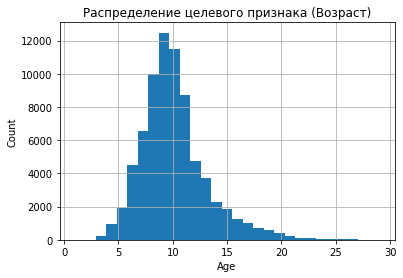

In [13]:
df_train['age'].hist(bins=29)
pltt.title('Распределение целевого признака (Возраст)')
pltt.xlabel('Age')
pltt.ylabel('Count')
pltt.show()

Из графика видно, что наибольшее количество крабов имеют возраст от 8 до 12 лет.  
Построим распределение признака пол

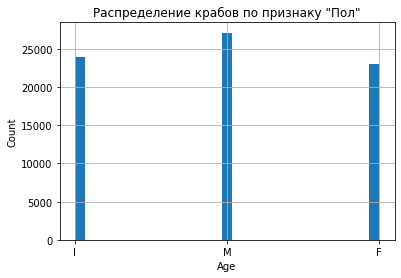

In [14]:
df_train['sex'].hist(bins=29)
pltt.title('Распределение крабов по признаку "Пол"')
pltt.xlabel('Age')
pltt.ylabel('Count')
pltt.show()

Из графика видно, что наибольшее количество крабов имеют пол "М", наименьшее количество с признаком "F"

In [15]:
df_train.describe()

,id,length,diameter,height,weight,shucked_weight,viscera_weight,shell_weight,age,viscera_ratio,...,body_condition_index,surface area,volume,density,pseudo bmi,length^2,diameter^2,log_weight,length_bins,weight_wo_viscera
count,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,...,74051.000000,74051.000000,74051.000000,7.405100e+04,7.405100e+04,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000
mean,37025.000000,1.317460,1.024496,0.348089,23.385217,10.104270,5.058386,6.723870,9.967806,0.216989,...,18.515094,4.553967,0.540190,inf,inf,1.818504,1.105948,3.000995,1.971074,5.045884
std,21376.826729,0.287757,0.237396,0.092034,12.648153,5.618025,2.792729,3.584372,3.175189,0.030319,...,11.227843,1.820808,0.300713,NaN,NaN,0.696120,0.446046,0.709378,0.717581,3.127723
min,0.000000,0.187500,0.137500,0.000000,0.056699,0.028349,0.042524,0.042524,1.000000,0.042254,...,0.017360,0.067813,0.000000,5.070428e+00,2.110061e+00,0.035156,0.018906,0.055150,0.000000,-4.436697
25%,18512.500000,1.150000,0.887500,0.300000,13.437663,5.712424,2.863300,3.968930,8.000000,0.199109,...,9.430187,3.263750,0.302998,4.073520e+01,1.457915e+02,1.322500,0.787656,2.669840,2.000000,2.622329
50%,37025.000000,1.375000,1.075000,0.362500,23.799405,9.908150,4.989512,6.931453,10.000000,0.215816,...,18.129664,4.793750,0.544219,4.376621e+01,1.743669e+02,1.890625,1.155625,3.210820,2.000000,4.720192
75%,55537.500000,1.537500,1.200000,0.412500,32.162508,14.033003,6.988152,9.071840,11.000000,0.233641,...,26.422373,5.930313,0.755283,4.722675e+01,2.000665e+02,2.363906,1.440000,3.501420,2.000000,7.073200
max,74050.000000,2.012815,1.612500,2.825000,80.101512,42.184056,21.545620,28.491248,29.000000,1.323630,...,78.715444,14.710625,3.321141,inf,inf,4.051422,2.600156,4.395702,3.000000,28.051830


In [16]:
df_train = df_train[df_train['height'] != 0]

In [17]:
df_train[df_train['height'] <0.1]

,id,sex,length,diameter,height,weight,shucked_weight,viscera_weight,shell_weight,age,...,body_condition_index,surface area,volume,density,pseudo bmi,length^2,diameter^2,log_weight,length_bins,weight_wo_viscera
356,356,I,0.4125,0.2875,0.0625,0.510291,0.184272,0.141747,0.141747,4,...,0.196947,0.324687,0.007412,68.845584,130.634496,0.170156,0.082656,0.412302,0,0.042524
374,374,I,0.4875,0.3125,0.0875,0.779611,0.255146,0.141747,0.255146,4,...,0.311401,0.444688,0.013330,58.485122,101.826776,0.237656,0.097656,0.576395,0,0.113398
936,936,I,0.4000,0.2750,0.0750,0.666213,0.212621,0.226796,0.141747,4,...,0.238035,0.321250,0.008250,80.753121,118.437911,0.160000,0.075625,0.510554,0,-0.014175
1242,1242,I,0.4000,0.3000,0.0625,0.595340,0.212621,0.155922,0.141747,4,...,0.225017,0.327500,0.007500,79.378600,152.406912,0.160000,0.090000,0.467087,0,0.056699
1403,1403,I,0.3750,0.3250,0.0750,0.368544,0.255146,0.141747,0.170097,4,...,0.187782,0.348750,0.009141,40.319289,65.518844,0.140625,0.105625,0.313747,0,0.113398
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72952,72952,I,0.4125,0.3000,0.0875,0.411068,0.141747,0.099223,0.141747,4,...,0.155034,0.372187,0.010828,37.962967,53.690482,0.170156,0.090000,0.344347,0,0.042524
73063,73063,I,0.4000,0.2750,0.0750,0.510291,0.155922,0.085048,0.141747,4,...,0.178399,0.321250,0.008250,61.853455,90.718400,0.160000,0.075625,0.412302,0,0.070874
73223,73223,M,0.5375,0.3875,0.0625,0.680388,0.354369,0.141747,0.212621,3,...,0.359994,0.532188,0.013018,52.266865,174.179328,0.288906,0.150156,0.519025,0,0.212621
73759,73759,I,0.4125,0.2750,0.0625,0.552815,0.212621,0.141747,0.170097,6,...,0.220194,0.312812,0.007090,77.972840,141.520704,0.170156,0.075625,0.440070,0,0.070874


In [18]:
df_train.drop('id', axis=1, inplace=True)

C:\Users\Мария\AppData\Local\Temp\ipykernel_7300\3764338739.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train.drop('id', axis=1, inplace=True)


Построим матрицу корелляции:

In [19]:
%%time
phik_overview = df_train.phik_matrix()

interval columns not set, guessing: ['length', 'diameter', 'height', 'weight', 'shucked_weight', 'viscera_weight', 'shell_weight', 'age', 'viscera_ratio', 'shell_ratio', 'shell_to_body-ratio', 'meat_yield', 'length_to_diameter_ratio', 'weight_to_visceraweight_ratio', 'weight_to_shellweight_ratio', 'weight_to_shuckedweight_ratio', 'body_condition_index', 'surface area', 'volume', 'density', 'pseudo bmi', 'length^2', 'diameter^2', 'log_weight', 'length_bins', 'weight_wo_viscera']
CPU times: total: 12.3 s
Wall time: 32.8 s


In [20]:
%%time
phik_overview.round(2)

CPU times: total: 266 ms
Wall time: 273 ms


,sex,length,diameter,height,weight,shucked_weight,viscera_weight,shell_weight,age,viscera_ratio,...,body_condition_index,surface area,volume,density,pseudo bmi,length^2,diameter^2,log_weight,length_bins,weight_wo_viscera
sex,1.00,0.63,0.63,0.49,0.64,0.61,0.63,0.63,0.58,0.13,...,0.63,0.63,0.76,0.26,0.02,0.63,0.63,0.64,0.44,0.55
length,0.63,1.00,0.97,0.78,0.92,0.90,0.90,0.89,0.73,0.28,...,0.92,0.94,0.79,0.29,0.03,0.98,0.96,0.96,0.94,0.82
diameter,0.63,0.97,1.00,0.78,0.92,0.90,0.90,0.90,0.74,0.25,...,0.92,0.96,0.78,0.32,0.03,0.96,0.98,0.97,0.93,0.82
height,0.49,0.78,0.78,1.00,0.78,0.77,0.77,0.78,0.65,0.13,...,0.78,0.99,0.87,0.25,0.01,0.78,0.78,0.79,0.56,0.71
weight,0.64,0.92,0.92,0.78,1.00,0.94,0.92,0.92,0.71,0.17,...,0.96,0.92,0.79,0.19,0.02,0.93,0.94,0.95,0.85,0.87
shucked_weight,0.61,0.90,0.90,0.77,0.94,1.00,0.91,0.88,0.67,0.16,...,0.98,0.90,0.74,0.18,0.01,0.91,0.91,0.91,0.83,0.95
viscera_weight,0.63,0.90,0.90,0.77,0.92,0.91,1.00,0.89,0.68,0.18,...,0.93,0.90,0.75,0.19,0.01,0.90,0.90,0.91,0.83,0.80
shell_weight,0.63,0.89,0.90,0.78,0.92,0.88,0.89,1.00,0.71,0.16,...,0.90,0.90,0.75,0.20,0.00,0.89,0.90,0.90,0.83,0.80
age,0.58,0.73,0.74,0.65,0.71,0.67,0.68,0.71,1.00,0.16,...,0.66,0.72,0.49,0.20,0.00,0.73,0.73,0.74,0.66,0.61
viscera_ratio,0.13,0.28,0.25,0.13,0.17,0.16,0.18,0.16,0.16,1.00,...,0.15,0.19,0.13,0.11,0.00,0.21,0.20,0.28,0.21,0.17


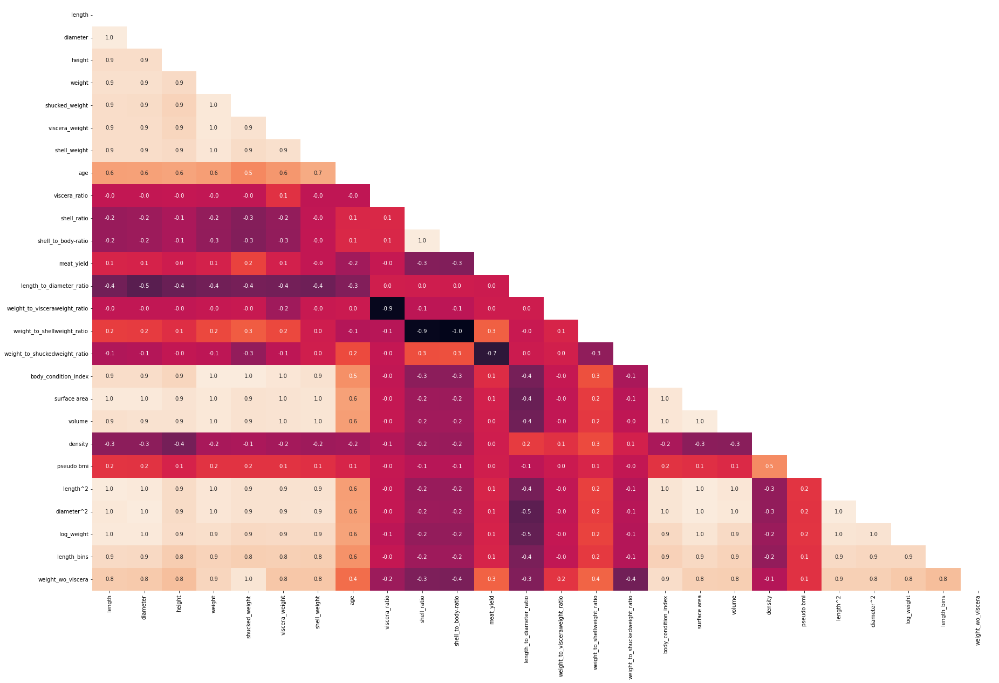

In [21]:
%%time
pltt.figure(figsize=(30,20))
sns.heatmap(df_train.corr(),annot=True,fmt="0.1f",cbar=False,mask=np.triu(df_train.corr()));
pltt.show()

CPU times: total: 6.39 s
Wall time: 7.16 s
CPU times: total: 3.48 s
Wall time: 4.16 s


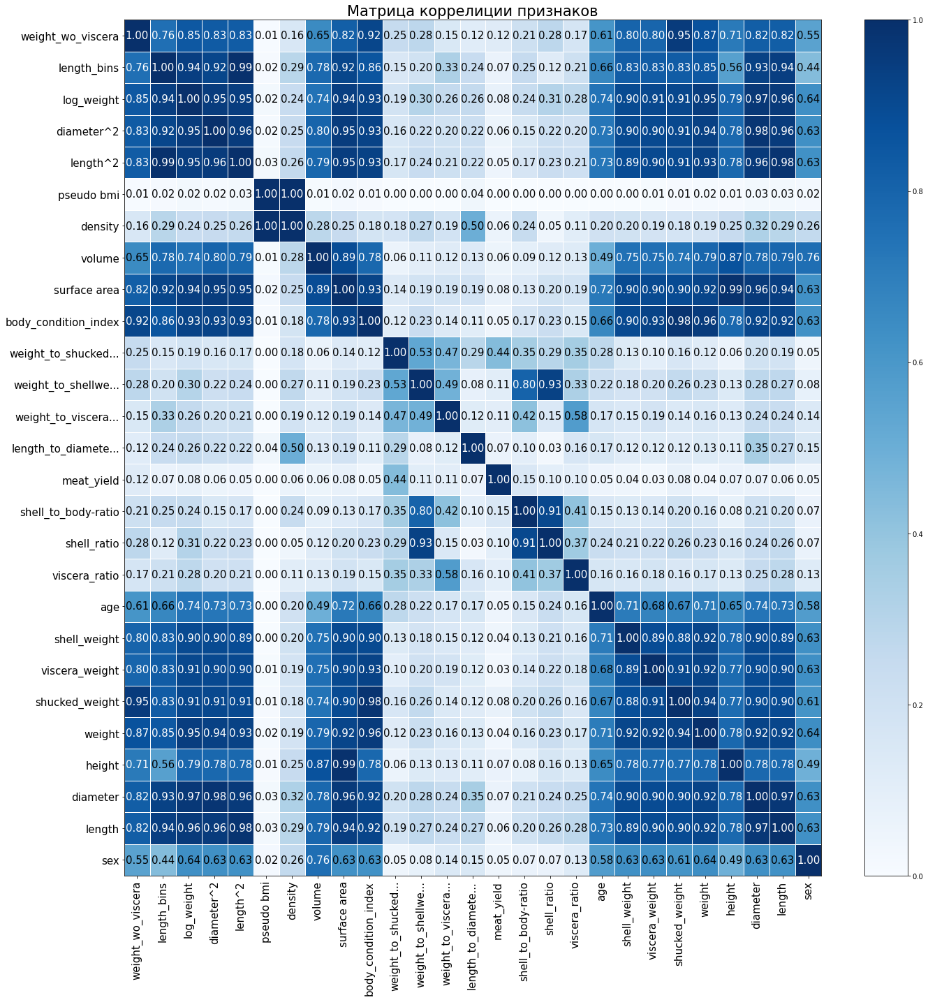

In [22]:
%%time
plot_correlation_matrix(phik_overview.values,
                       x_labels = phik_overview.columns,
                       y_labels = phik_overview.index,
                       vmin = 0, vmax = 1, color_map = "Blues",
                       title = 'Матрица коррелиции признаков',
                       fontsize_factor=1.5,
                       figsize=(20,20))

CPU times: total: 3h 9min 52s
Wall time: 3h 16min 13s


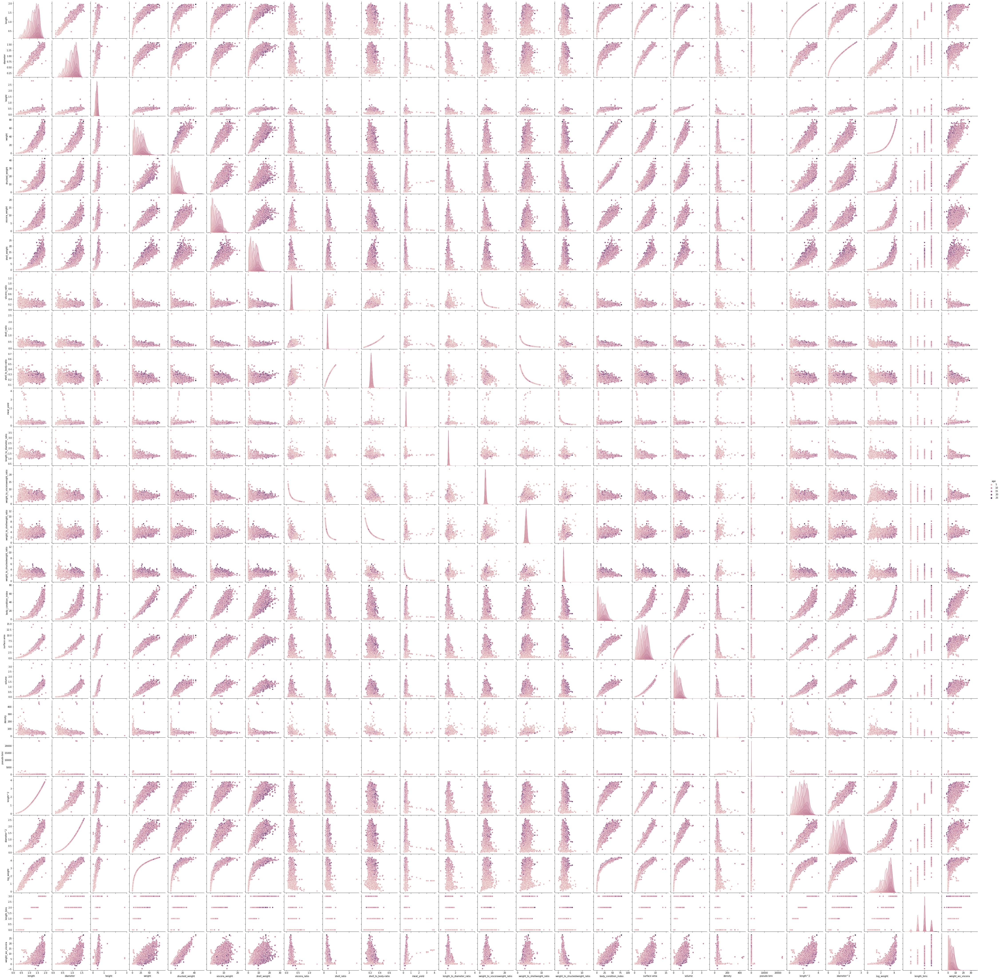

In [26]:
%%time
sns.pairplot(data = df_train, hue = 'age')

## Создание обучающих признаков и таргета. Построение пайплайна

In [27]:
features_train = df_train.drop('age', axis =1)

In [28]:
target_train = df_train.age

In [29]:
num_column_selector = selector(dtype_exclude='object')
cat_column_selector = selector(dtype_include='object')

In [30]:
numerical_columns = num_column_selector(features_train)
categorial_columns = cat_column_selector(features_train)

In [31]:
num_pipeline = Pipeline([('scaler', StandardScaler())])

In [32]:
cat_pipeline = Pipeline([('OHE', OneHotEncoder(drop='first',handle_unknown='ignore', sparse=False))])

In [33]:
col_pipeline = ColumnTransformer([('num_cols', num_pipeline, numerical_columns),
                                  ('cat_cols', cat_pipeline, categorial_columns)],
                                remainder='passthrough')

In [34]:
pipeline = make_pipeline(col_pipeline)
pipeline

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num_cols',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['length', 'diameter',
                                                   'height', 'weight',
                                                   'shucked_weight',
                                                   'viscera_weight',
                                                   'shell_weight',
                                                   'viscera_ratio',
                                                   'shell_ratio',
                                                   'shell_to_body-ratio',
                                                   'meat_yield',
                                                   'l

In [35]:
pipeline.steps.append(('clf', DummyClassifier(random_state=12345)))

## Создадим параметры для моделей

Зададим параметры для моделей: Линейная регрессия, CatBoost и LGBM

In [38]:
estimators_range = [int(x) for x in np.linspace(start = 10, stop = 2000, num = 50)]
max_depth_range = [int(x) for x in np.linspace(start = 1, stop = 15, num = 5)]

params = [
    {
    'clf' : [LinearRegression()],
    'C'  : [1e-1, 1e1, 1e2, 1e3]
    },

    
    {
    'clf' : [CatBoostRegressor(random_state=RANDOM_STATE, verbose=50)],
    'clf__n_estimators': estimators_range,
    'clf__max_depth': max_depth_range,
    'clf__logging_level' : ['Silent'],
    'clf__loss_function' : ['MAE'],
    'clf__columntransformer__num_cols__scaler': [None]
    },
    
    
    {
    'clf' : [LGBMRegressor(random_state=RANDOM_STATE, n_jobs=-1)],
    'clf__max_depth' : [3,5,10],
    'clf__n_estimators' : [100, 500, 1000, 2000],
    'clf__learning_rate' : [0.01, 0.1, 0.5],
    'clf__metric' : ['mean_absolute_error'],
    'clf__objective' : ['mae']
    },   

]

grid = RandomizedSearchCV(pipeline,
                         params,
                         n_iter=100,
                         cv=5,
                         verbose=1,
                         random_state=RANDOM_STATE,
                         scoring='neg_mean_absolute_error', 
                         n_jobs=-1)

Обучим пайплайн и выберем наилучшую модель:

In [39]:
%%time

grid.fit(features_train, target_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


C:\anaconda\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
435 fits failed out of a total of 500.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
435 fits failed with the following error:
Traceback (most recent call last):
  File "C:\anaconda\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\anaconda\lib\site-packages\sklearn\pipeline.py", line 394, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "C:\anaconda\lib\site-packages\catboost\core.py", line 5726, in fit
    _process_synonyms(params)
  File "C:\anaconda\lib\site-packages\catboost\core.py", line 1612, in _process_synonyms
 

CPU times: total: 2min 43s
Wall time: 16min 54s


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('columntransformer',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('num_cols',
                                                                               Pipeline(steps=[('scaler',
                                                                                                StandardScaler())]),
                                                                               ['length',
                                                                                'diameter',
                                                                                'height',
                                                                                'weight',
                                                                                'shucked_weight',
                                             

In [40]:
grid.best_estimator_

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num_cols',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['length', 'diameter',
                                                   'height', 'weight',
                                                   'shucked_weight',
                                                   'viscera_weight',
                                                   'shell_weight',
                                                   'viscera_ratio',
                                                   'shell_ratio',
                                                   'shell_to_body-ratio',
                                                   'meat_yield',
                                                   'l

Выведем модель с лучшими гиперпараметрами:

In [41]:
grid.best_params_

{'clf__objective': 'mae',
 'clf__n_estimators': 2000,
 'clf__metric': 'mean_absolute_error',
 'clf__max_depth': 10,
 'clf__learning_rate': 0.01,
 'clf': LGBMRegressor(learning_rate=0.01, max_depth=10, metric='mean_absolute_error',
               n_estimators=2000, objective='mae', random_state=12345)}

{'clf__objective': 'mae',  
 'clf__n_estimators': 2000,  
 'clf__metric': 'mean_absolute_error',  
 'clf__max_depth': 10,  
 'clf__learning_rate': 0.01,  
 'clf': LGBMRegressor(learning_rate=0.01, max_depth=10, metric='mean_absolute_error',  
               n_estimators=2000, objective='mae', random_state=12345)}

In [67]:
display(f'На тренировочных данных и кроссвалидации получена метрика МАЕ {abs(grid.best_score_)}')

'На тренировочных данных и кроссвалидации получена метрика МАЕ 1.3647195617049133'

In [42]:
cv_results = pd.DataFrame(grid.cv_results_)
cv_results = cv_results.sort_values("mean_test_score", ascending=False)
cv_results[['params','param_clf', 'rank_test_score', 'mean_test_score', 'std_test_score','mean_fit_time']].head(10)

,params,param_clf,rank_test_score,mean_test_score,std_test_score,mean_fit_time
51,"{'clf__objective': 'mae', 'clf__n_estimators':...","LGBMRegressor(learning_rate=0.01, max_depth=10...",1,-1.364720,0.007590,90.996297
61,"{'clf__objective': 'mae', 'clf__n_estimators':...","LGBMRegressor(learning_rate=0.01, max_depth=10...",2,-1.365811,0.007427,21.781512
35,"{'clf__objective': 'mae', 'clf__n_estimators':...","LGBMRegressor(learning_rate=0.01, max_depth=10...",3,-1.368124,0.009175,71.993028
79,"{'clf__objective': 'mae', 'clf__n_estimators':...","LGBMRegressor(learning_rate=0.01, max_depth=10...",4,-1.369661,0.009112,23.153732
56,"{'clf__objective': 'mae', 'clf__n_estimators':...","LGBMRegressor(learning_rate=0.01, max_depth=10...",5,-1.377324,0.006939,4.665461
73,"{'clf__objective': 'mae', 'clf__n_estimators':...","LGBMRegressor(learning_rate=0.01, max_depth=10...",6,-1.380414,0.009629,25.207120
58,"{'clf__objective': 'mae', 'clf__n_estimators':...","LGBMRegressor(learning_rate=0.01, max_depth=10...",7,-1.382091,0.006262,51.673943
84,"{'clf__objective': 'mae', 'clf__n_estimators':...","LGBMRegressor(learning_rate=0.01, max_depth=10...",7,-1.382091,0.006262,13.267838
90,"{'clf__objective': 'mae', 'clf__n_estimators':...","LGBMRegressor(learning_rate=0.01, max_depth=10...",7,-1.382091,0.006262,24.019915
80,"{'clf__objective': 'mae', 'clf__n_estimators':...","LGBMRegressor(learning_rate=0.01, max_depth=10...",10,-1.423199,0.004811,33.573481


In [43]:
cv_results[['params']].head(1).values

array([[{'clf__objective': 'mae', 'clf__n_estimators': 2000, 'clf__metric': 'mean_absolute_error', 'clf__max_depth': 10, 'clf__learning_rate': 0.01, 'clf': LGBMRegressor(learning_rate=0.01, max_depth=10, metric='mean_absolute_error',
                      n_estimators=2000, objective='mae', random_state=12345)}                                                                                                                                                           ]],
      dtype=object)

In [63]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49368 entries, 0 to 49367
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   id                             49368 non-null  float64
 1   sex                            49368 non-null  object 
 2   length                         49368 non-null  float64
 3   diameter                       49368 non-null  float64
 4   height                         49368 non-null  float64
 5   weight                         49368 non-null  float64
 6   shucked_weight                 49368 non-null  float64
 7   viscera_weight                 49368 non-null  float64
 8   shell_weight                   49368 non-null  float64
 9   viscera_ratio                  49368 non-null  float64
 10  shell_ratio                    49368 non-null  float64
 11  shell_to_body-ratio            49368 non-null  float64
 12  meat_yield                     49368 non-null 

In [60]:
df_test.describe()

,id,length,diameter,height,weight,shucked_weight,viscera_weight,shell_weight,viscera_ratio,shell_ratio,...,body_condition_index,surface area,volume,density,pseudo bmi,length^2,diameter^2,log_weight,length_bins,weight_wo_viscera
count,49368.000000,49368.000000,49368.000000,49368.000000,49368.000000,49368.000000,49368.000000,49368.000000,49368.000000,49368.000000,...,49368.000000,49368.000000,49368.000000,4.936800e+04,4.936800e+04,49368.000000,49368.000000,49368.000000,49368.000000,49368.000000
mean,98734.500000,1.319795,1.026357,0.348693,23.464627,10.130220,5.072615,6.745876,0.216816,0.292944,...,18.579132,4.568144,0.542398,inf,inf,1.824198,1.109384,3.005944,1.914276,5.057604
std,14251.458382,0.286950,0.236593,0.092259,12.641703,5.611779,2.791563,3.575650,0.031132,0.041271,...,11.224207,1.817819,0.300582,NaN,NaN,0.694871,0.445071,0.706054,0.677970,3.121613
min,74051.000000,0.187500,0.137500,0.000000,0.056699,0.028349,0.014175,0.042524,0.051643,0.046948,...,0.017360,0.067813,0.000000,4.809302e+00,2.110061e+00,0.035156,0.018906,0.055150,0.000000,-0.566990
25%,86392.750000,1.162500,0.887500,0.300000,13.536886,5.740774,2.877474,3.968930,0.198827,0.267559,...,9.526359,3.284687,0.306187,4.066080e+01,1.465360e+02,1.351406,0.787656,2.676689,2.000000,2.650678
50%,98734.500000,1.387500,1.075000,0.362500,23.813580,9.979024,4.989512,6.945627,0.215712,0.288873,...,18.201074,4.804375,0.546563,4.372614e+01,1.743784e+02,1.925156,1.155625,3.211391,2.000000,4.748541
75%,111076.250000,1.537500,1.200000,0.412500,32.290081,14.047177,7.016501,9.171063,0.233428,0.314233,...,26.509862,5.954688,0.757031,4.720599e+01,1.999904e+02,2.363906,1.440000,3.505259,2.000000,7.101550
max,123418.000000,2.037500,1.625000,2.825000,80.101512,42.184056,21.545620,28.491248,2.146974,2.567766,...,78.715444,14.666875,3.347098,inf,inf,4.151406,2.640625,4.395702,3.000000,28.788917


запустим расчет предсказаний на тестовых данных и сохраним результат в файл

In [61]:
df_test[df_test['volume'] == 0] = df_test.loc[df_test.volume != 0]['volume'].mean()

In [62]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49368 entries, 0 to 49367
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   id                             49368 non-null  float64
 1   sex                            49368 non-null  object 
 2   length                         49368 non-null  float64
 3   diameter                       49368 non-null  float64
 4   height                         49368 non-null  float64
 5   weight                         49368 non-null  float64
 6   shucked_weight                 49368 non-null  float64
 7   viscera_weight                 49368 non-null  float64
 8   shell_weight                   49368 non-null  float64
 9   viscera_ratio                  49368 non-null  float64
 10  shell_ratio                    49368 non-null  float64
 11  shell_to_body-ratio            49368 non-null  float64
 12  meat_yield                     49368 non-null 

In [64]:
df_test.drop('id', axis=1, inplace=True)

#test_cat = pd.get_dummies(df_test['sex'])
#df_test = pd.concat([df_test, test_cat], axis=1).drop('sex', axis = 1)

test_predicts = grid.predict(df_test)

output = pd.DataFrame({'id': df_all.id, 'age': test_predicts})

print (output)

output.to_csv('submission.csv', index=False)

           id        age
0       74051   7.785040
1       74052   7.923204
2       74053  10.139193
3       74054   8.994694
4       74055   7.077488
...       ...        ...
49363  123414   8.910019
49364  123415   7.849459
49365  123416  12.788416
49366  123417   9.759025
49367  123418  11.089479

[49368 rows x 2 columns]
